# Info
Purpose:

    Redo of muSSTAR radiometer tests, now with python 3.
    This is the repository of notes and test results

Input:

    None

Output:

    Figures and analysis

Keywords:

    none

Dependencies:

    - load_utils.py
    - matplotlib
    - numpy
    - write_utils
    - path_utils
    - scipy

Needed Files:
  - 5STARG_* RADIOMETERS.dat files

Modification History:

    Written: Samuel LeBlanc, Santa Cruz, CA, 2021-05-11
    Modified:


# Notes

## Test from 2021-05-05 with labjack
Included is the data set from last Wednesday we were discussing. For this test the cold block was set to 20C and the hot block was set to 30C. The TEC NIR drivers were turned off to avoid a thermal overrun. This was with an air cooled system.

This test features a slightly new data format because we are now using the labjack. All of the normal channel data should be the same but there are now 3 new connectors to plug into. For this test I plugged a temp sensor and other things into J7 which was recorded. J7 has 8 analog inputs. They were used as follows:

 >J7_1 - 5v Power supply monitoring  
 J7_2 - Cold block controller temp monitor  
 J7_3 - Hot block controller temp monitor  
 J7_4 - Cold block temp sensor  
 J7_5 - NIR Board temp sensor  
 J7_6 - Hot block temp sensor  
 J7_7 - Lid temperature  
 J7_8 - Ambient Temperature  

The cold and hot block controller temp monitors (J7_2 and J7_3) are different from our normal temperature sensors. This is the output from the thermistor that the controllers use for feedback control. It runs a constant current through the thermistors making a voltage output. Our current is set at 100 uA. I've included the thermistor data sheet. Unfortunately thermistor response is non linear at the macro level so unless you want to do a lot of ln() calculations there isn't a simple equation to convert from resistance to temperature. I'll list off the relative temp and equivalent voltages.

> 19C - 1.307V  
 20C - 1.249V  
 21C - 1.194V  
  
> 29C - 0.840V  
30C - 0.805V  
31C - 0.772V  
  
Probably not a lot of useful data in this test but it should be a good primer for the next data set that I'm working on right now.

Let me know if you have any questions.

Thanks,

Conrad Esch  
 5STARG_20210505_152031_RADIOMETERS.dat

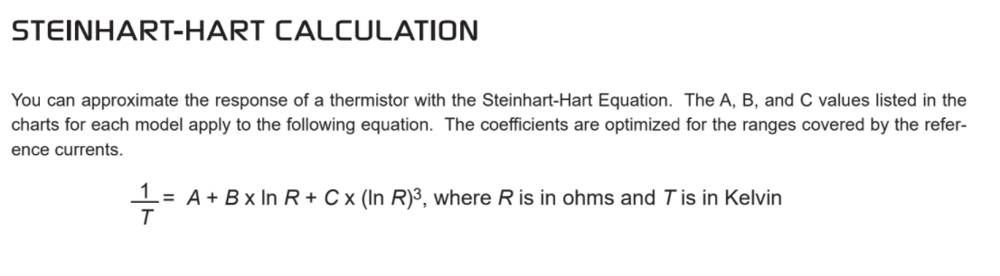

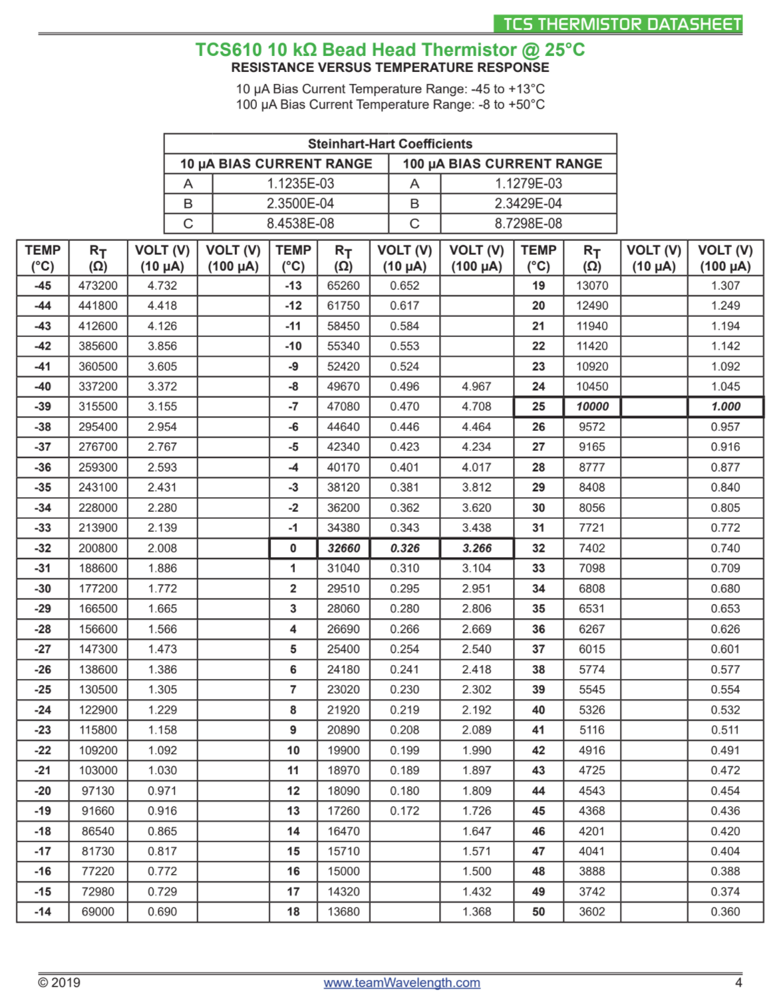

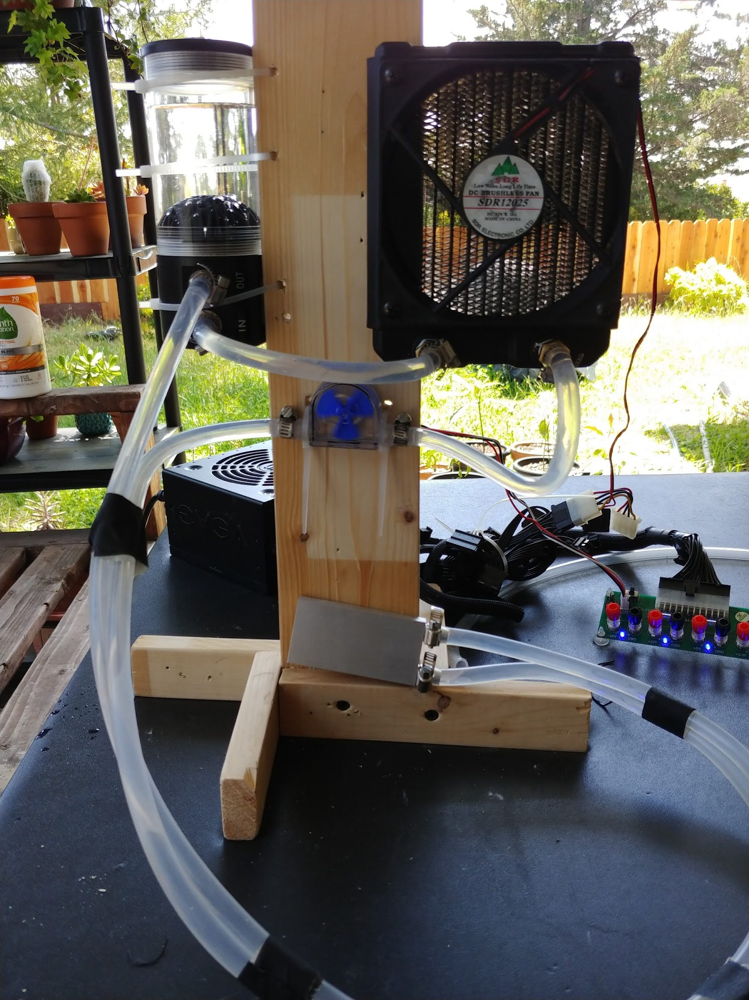

## Test from 2021-05-11 - Long test
Included is the data set I got yesterday.

This should be almost the same as the last data set with one minor difference. I accidentally flipped the Lid and Ambient air temperature sensors so now J7_7 is in free air and J7_8 is attached to the lid. Apologies for the inconvenience. The test ran for 7 hours. Below are the labels for J7.

> J7_1 - 5v Power supply monitoring  
J7_2 - Cold block controller temp monitor  
J7_3 - Hot block controller temp monitor  
J7_4 - Cold block temp sensor  
J7_5 - NIR Board temp sensor  
J7_6 - Hot block temp sensor  
J7_7 - Ambient Temperature  
J7_8 - Lid Temperature  

 5STARG_20210511_131357_RADIOMETERS.dat  

I'm running 2 more tests today. One is a cold start test to see how long we should wait for the system to stabilize (I suspect the temperatures are a bit oscillatory in the beginning.) The other is a second long test to verify the data in this email. Please let me know if you have any questions.

Thanks,

Conrad Esch

# Prepare python environment

In [13]:
import numpy as np
import Sp_parameters as Sp
import load_utils as lu
import write_utils as wu
from path_utils import getpath
import hdf5storage as hs
import scipy.io as sio
import matplotlib.pyplot as plt
%matplotlib notebook
import os


In [17]:
plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower 

In [16]:
name = 'muSSTAR'
vv = 'v1'
fp = getpath(name)


Return path named:  muSSTAR /data/sam/muSSTAR/


In [101]:
import muSSTAR_utils as u
import importlib
importlib.reload(u)

<module 'muSSTAR_utils' from '/home/sam/python_codes/muSSTAR_utils.py'>

# Load and plot tests

## Test 2021-05-05

In [58]:
s = u.reader_RADIOMETER(fp+'data/5STARG_20210505_152031_RADIOMETERS.dat',islabjack=True)

56946 56946


In [59]:
s.keys()

Index(['YYYY', 'MM', 'DD', 'hh:mm:ss', 'CH1_0', 'CH1_2', 'CH1_4', 'CH2_0',
       'CH2_2', 'CH2_4', 'CH3_0', 'CH3_2', 'CH3_4', 'CH4_0', 'CH4_2', 'CH4_4',
       'CH5_0', 'CH5_2', 'CH5_4', '5v_0_66', 'CH6_0', 'CH6_2', 'CH6_4',
       'CH7_0', 'CH7_2', 'CH7_4', 'CH8_0', 'CH8_2', 'CH8_4', 'CH9_0', 'CH9_2',
       'CH9_4', 'spare', '5vref_temp', '12pos_0_33', '12neg_0_33', 'j7_1',
       'j7_2', 'j7_3', 'j7_4', 'j7_5', 'j7_6', 'j7_7', 'j7_8', 'UTC', 'sza',
       'azi', 'sf', 'dec', 'ref5v', 'ref12v_pos', 'ref12v_neg', '5vtef_tempC',
       'V1_0', 'V1_2', 'V1_4', 'V2_0', 'V2_2', 'V2_4', 'V3_0', 'V3_2', 'V3_4',
       'V4_0', 'V4_2', 'V4_4', 'V5_0', 'V5_2', 'V5_4', 'V6_0', 'V6_2', 'V6_4',
       'V7_0', 'V7_2', 'V7_4', 'V8_0', 'V8_2', 'V8_4', 'V9_0', 'V9_2', 'V9_4'],
      dtype='object')

In [61]:
u.define_long_names(s)

In [63]:
s.label = 'labjack_first_test'

### Plots

In [71]:
u.clean_up_and_prep_for_plots(s,fp+'plots/')

<IPython.core.display.Javascript object>


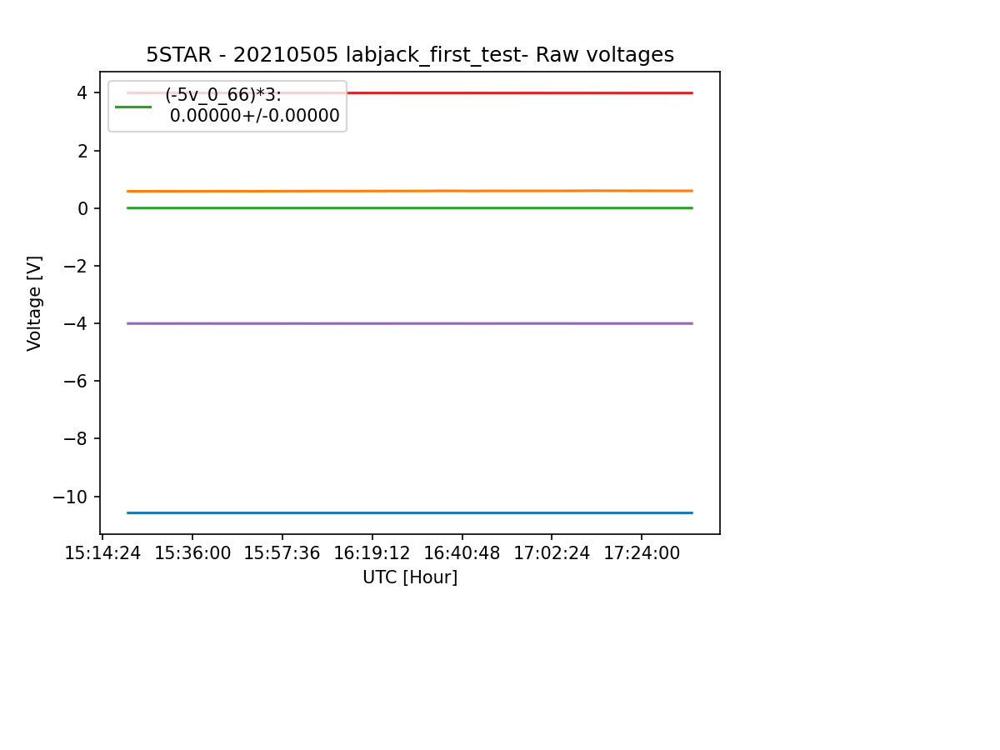

<IPython.core.display.Javascript object>


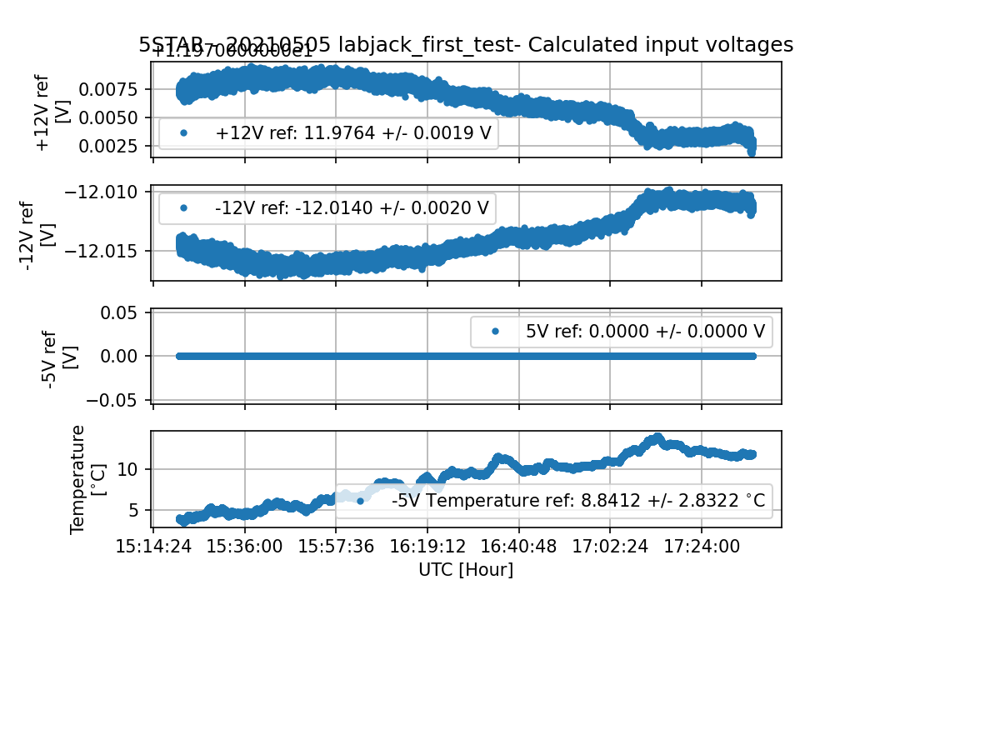

In [76]:
u.plt_hskp(s,fp+'plots/')

## Test 2021-05-12

In [102]:
s = u.reader_RADIOMETER(fp+'data/5STARG_20210511_131357_RADIOMETERS.dat',islabjack=True)

175233 175233


In [103]:
s.keys()

Index(['YYYY', 'MM', 'DD', 'hh:mm:ss', 'CH1_0', 'CH1_2', 'CH1_4', 'CH2_0',
       'CH2_2', 'CH2_4', 'CH3_0', 'CH3_2', 'CH3_4', 'CH4_0', 'CH4_2', 'CH4_4',
       'CH5_0', 'CH5_2', 'CH5_4', '5v_0_66', 'CH6_0', 'CH6_2', 'CH6_4',
       'CH7_0', 'CH7_2', 'CH7_4', 'CH8_0', 'CH8_2', 'CH8_4', 'CH9_0', 'CH9_2',
       'CH9_4', 'spare', '5vref_temp', '12pos_0_33', '12neg_0_33', 'j7_1',
       'j7_2', 'j7_3', 'j7_4', 'j7_5', 'j7_6', 'j7_7', 'j7_8', 'UTC', 'sza',
       'azi', 'sf', 'dec', 'ref5v', 'ref12v_pos', 'ref12v_neg', '5vtef_tempC',
       'V1_0', 'V1_2', 'V1_4', 'V2_0', 'V2_2', 'V2_4', 'V3_0', 'V3_2', 'V3_4',
       'V4_0', 'V4_2', 'V4_4', 'V5_0', 'V5_2', 'V5_4', 'V6_0', 'V6_2', 'V6_4',
       'V7_0', 'V7_2', 'V7_4', 'V8_0', 'V8_2', 'V8_4', 'V9_0', 'V9_2', 'V9_4'],
      dtype='object')

In [79]:
u.define_long_names(s)

In [80]:
s.label = 'labjack_long_test'

### Plots

In [81]:
u.clean_up_and_prep_for_plots(s,fp+'plots/')

<IPython.core.display.Javascript object>


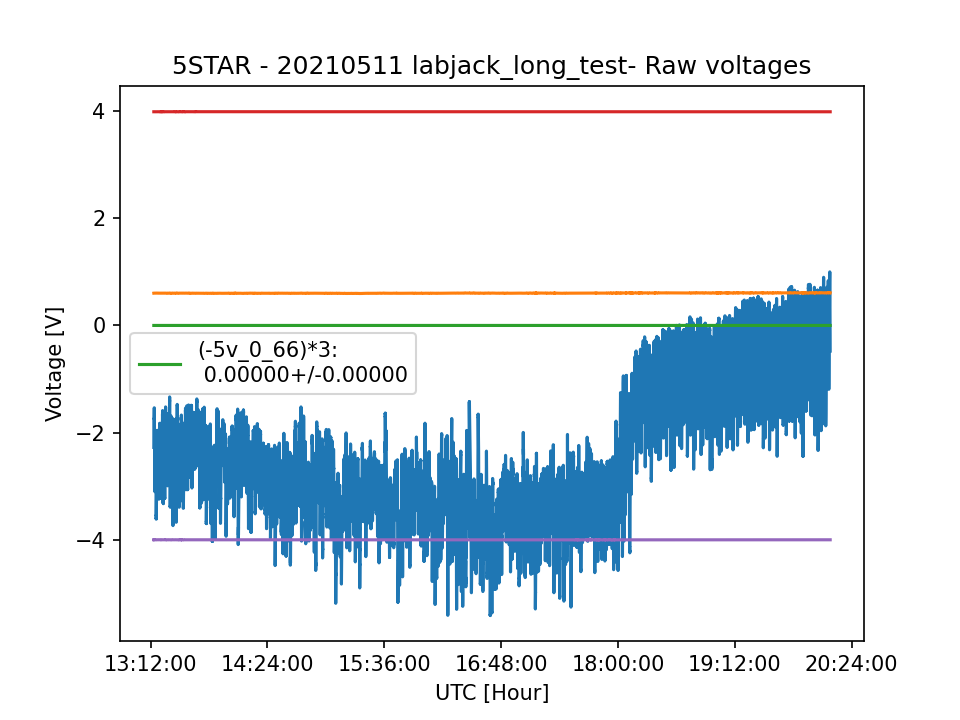

<IPython.core.display.Javascript object>


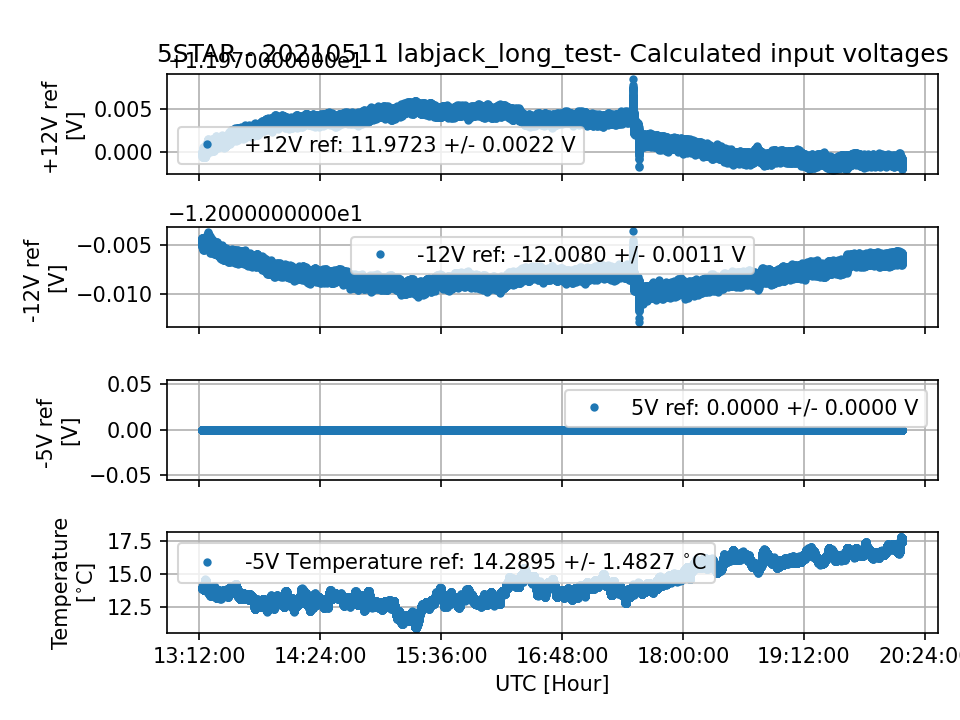

In [82]:
u.plt_hskp(s,fp+'plots/')

<IPython.core.display.Javascript object>


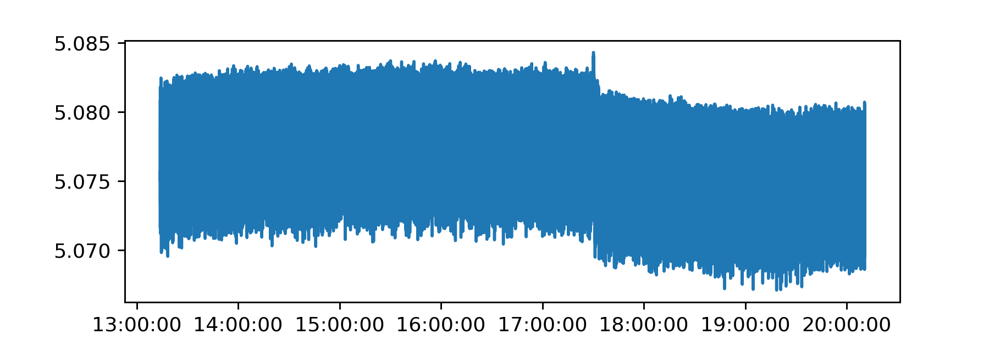

In [105]:
plt.figure()
plt.plot(s['UTC'],s['j7_1'])
plt.gca().xaxis.set_major_formatter(myFmt)

<IPython.core.display.Javascript object>


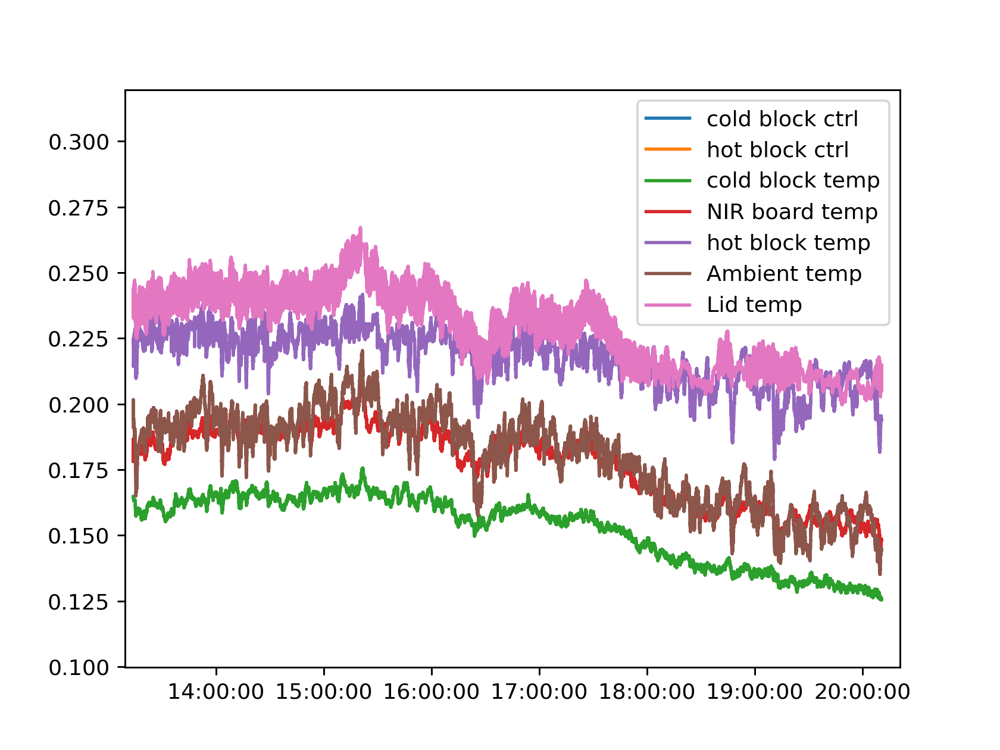

In [100]:
plt.figure()
# 'J7_1' : '5v Power supply monitoring',
#        'J7_2' : 'Cold block controller temp monitor',
#        'J7_3' : 'Hot block controller temp monitor',
#        'J7_4' : 'Cold block temp sensor',
#        'J7_5' : 'NIR Board temp sensor',
#        'J7_6' : 'Hot block temp sensor',
#        'J7_7':'Ambient Temperature',
#        'J7_8':'Lid Temperature'
import matplotlib.dates as mdates
plt.plot(s['UTC'],s['j7_2'],label='cold block ctrl')
plt.plot(s['UTC'],s['j7_3'],label='hot block ctrl')
plt.plot(s['UTC'],s['j7_4'],label='cold block temp')
plt.plot(s['UTC'],s['j7_5'],label='NIR board temp')
plt.plot(s['UTC'],s['j7_6'],label='hot block temp')
plt.plot(s['UTC'],s['j7_7'],label='Ambient temp')
plt.plot(s['UTC'],s['j7_8'],label='Lid temp')
myFmt = mdates.DateFormatter('%H:%M:%S')
plt.gca().xaxis.set_major_formatter(myFmt)
plt.legend()

<IPython.core.display.Javascript object>


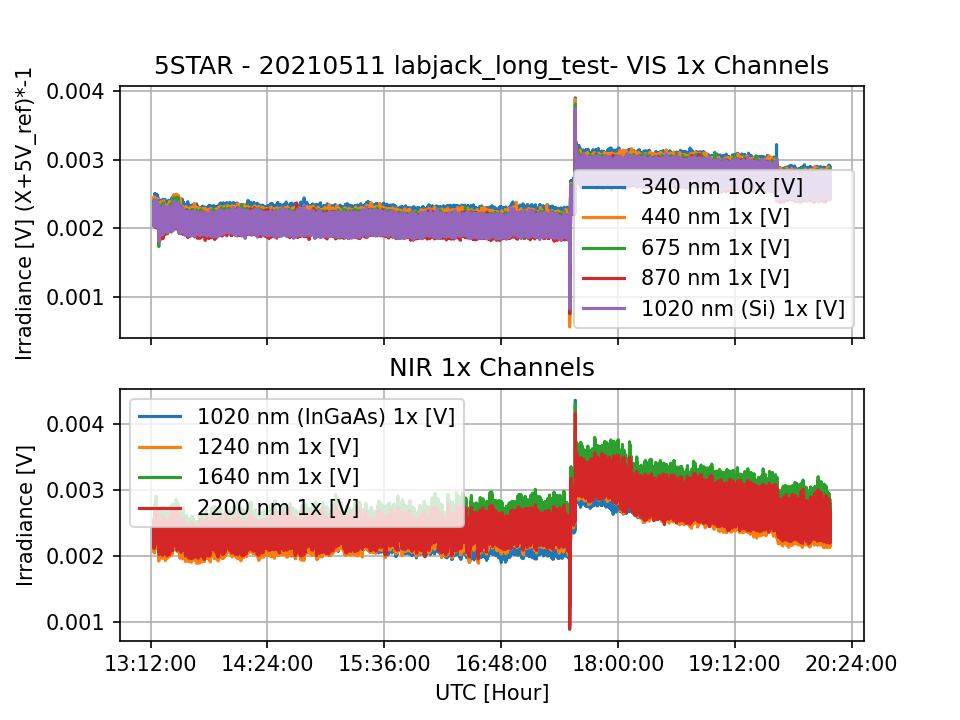

<IPython.core.display.Javascript object>


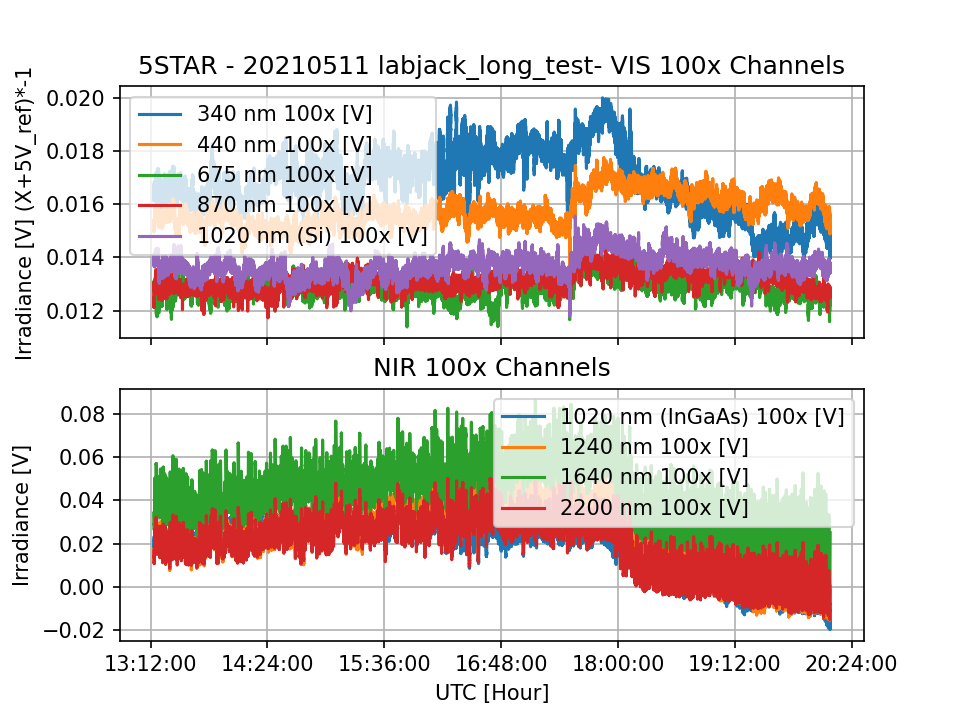

<IPython.core.display.Javascript object>


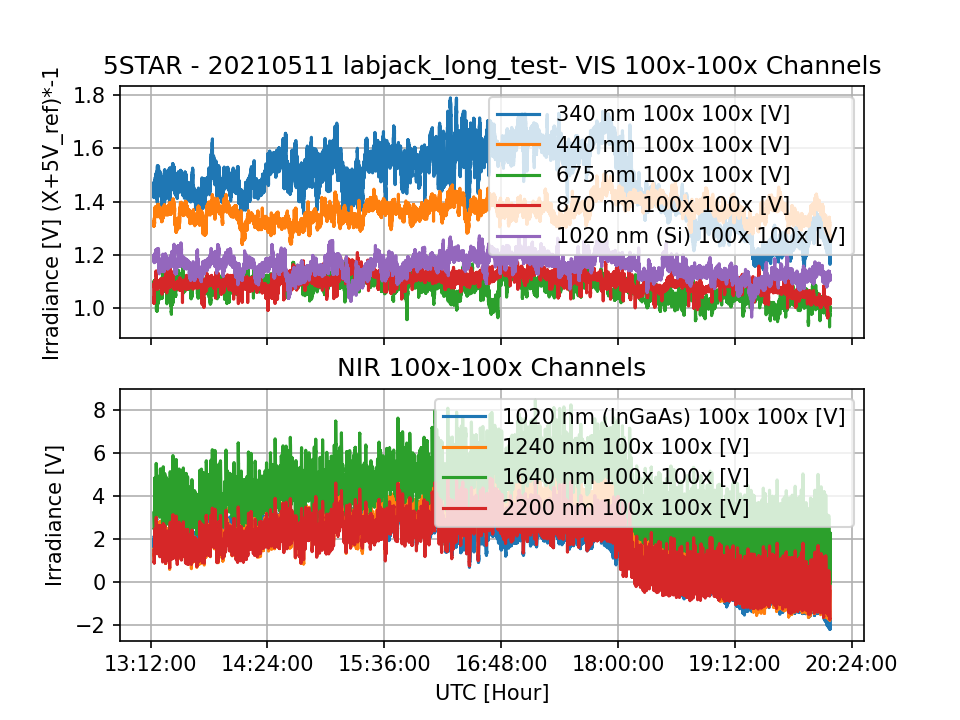

<IPython.core.display.Javascript object>


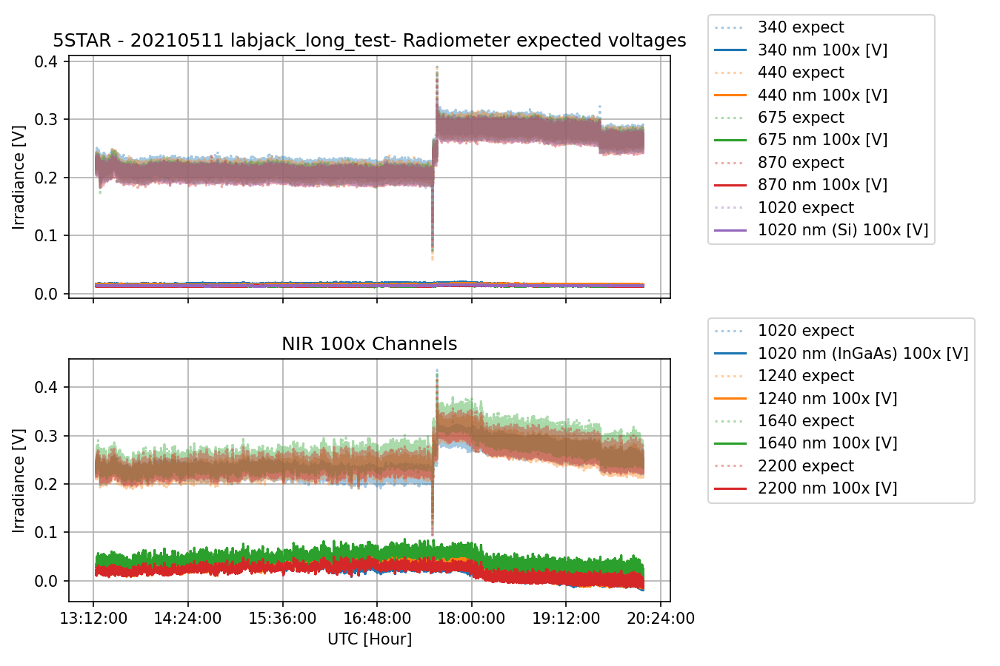

<IPython.core.display.Javascript object>


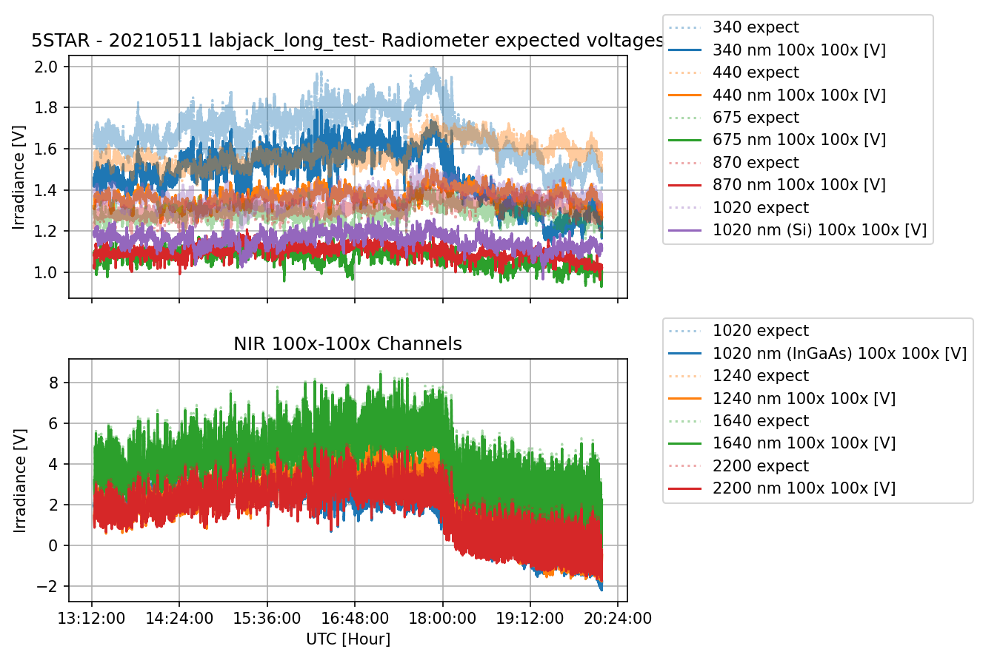

In [88]:
u.plt_gains(s,fp+'plots/')

<IPython.core.display.Javascript object>


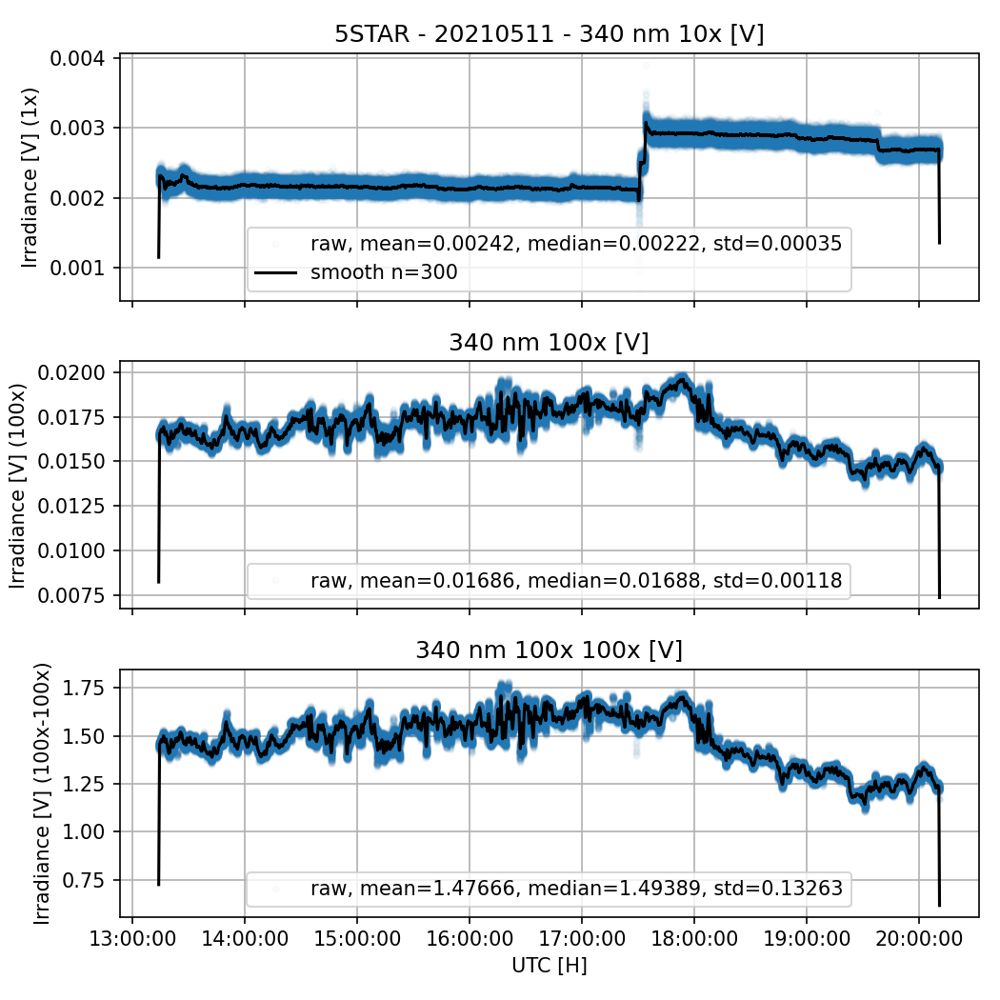

<IPython.core.display.Javascript object>


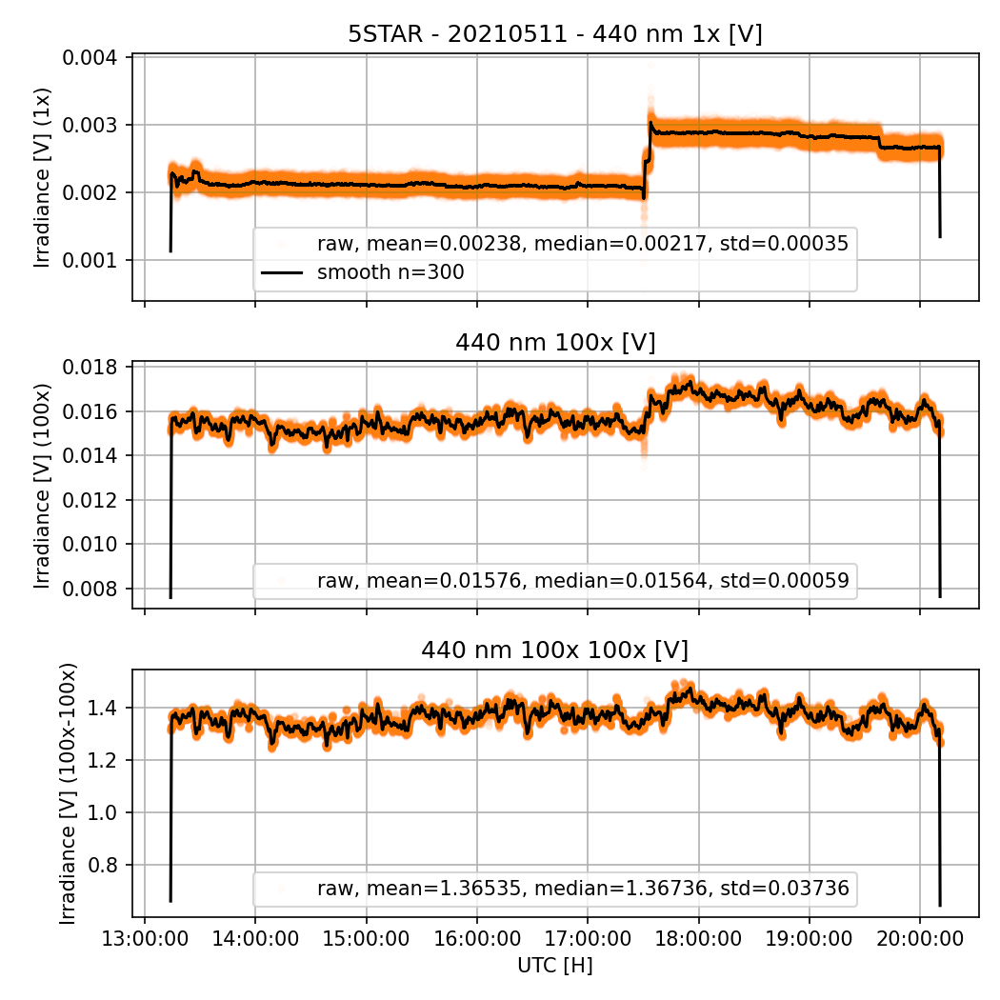

<IPython.core.display.Javascript object>


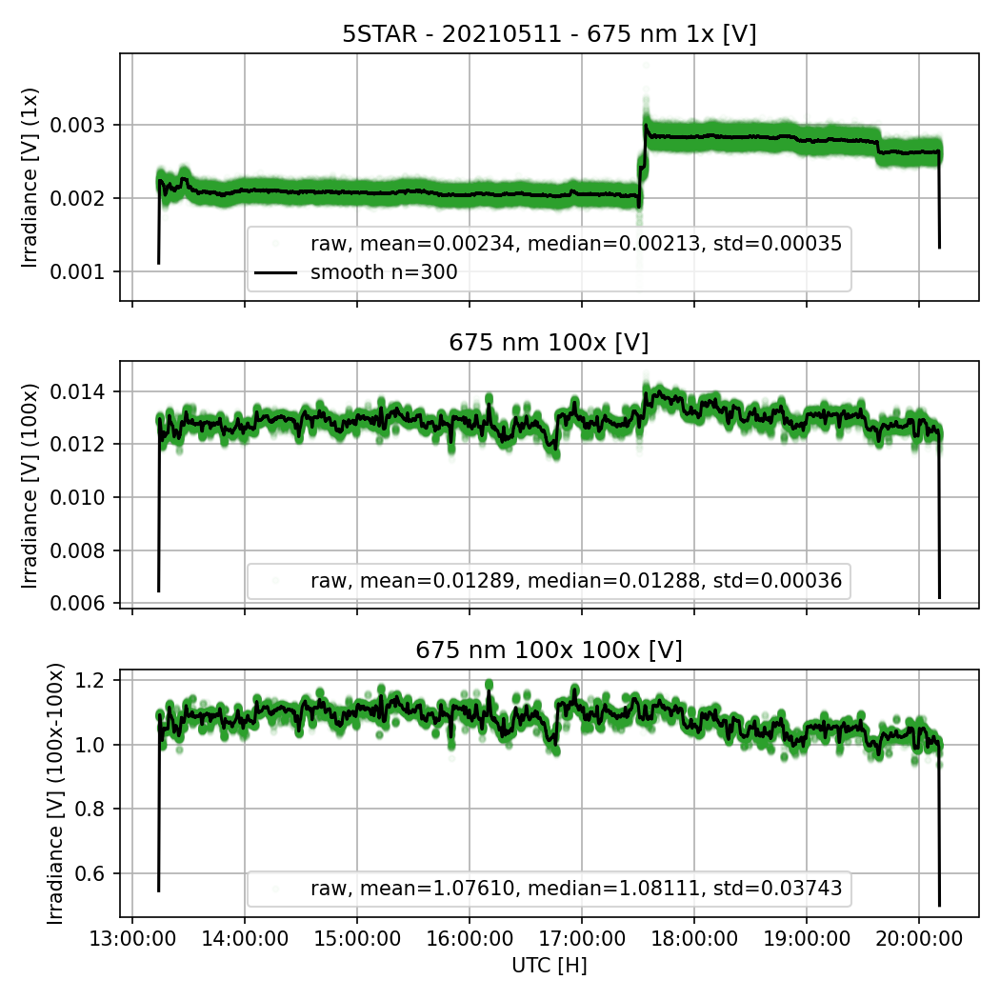

<IPython.core.display.Javascript object>


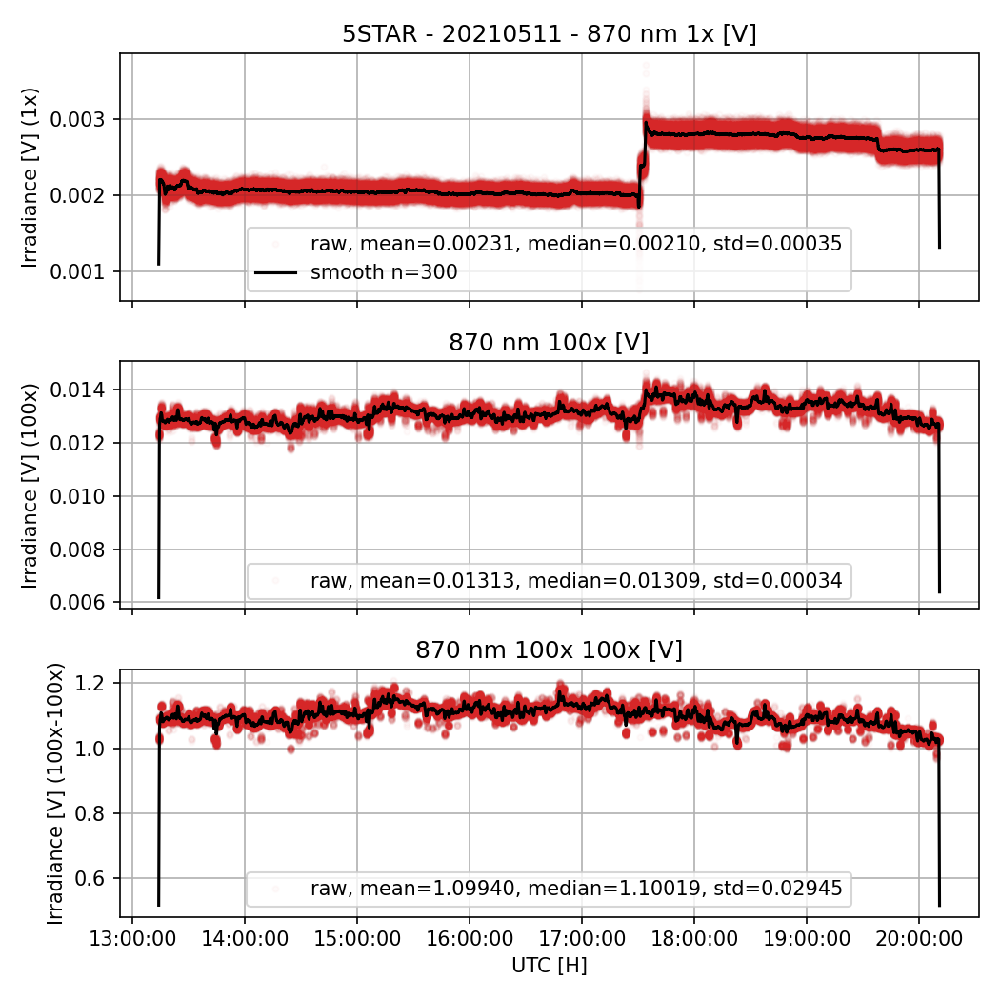

<IPython.core.display.Javascript object>


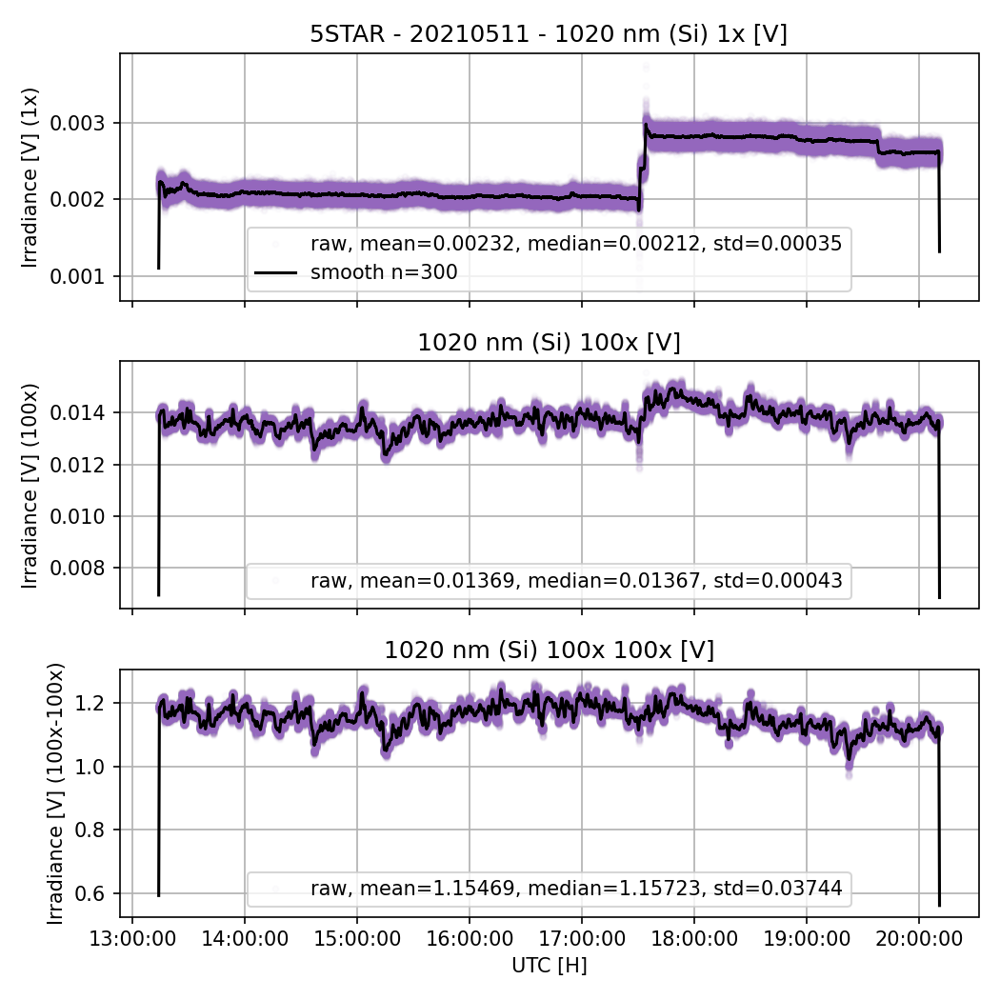

<IPython.core.display.Javascript object>


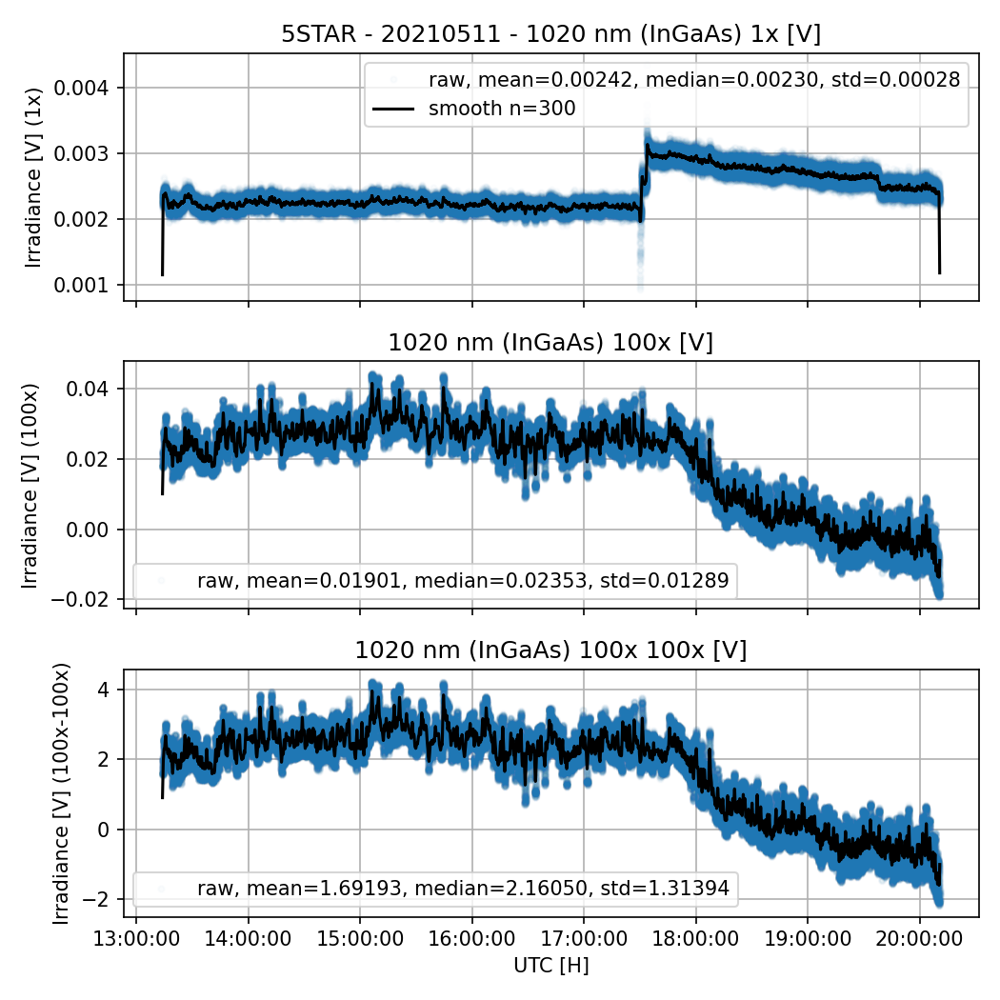

<IPython.core.display.Javascript object>


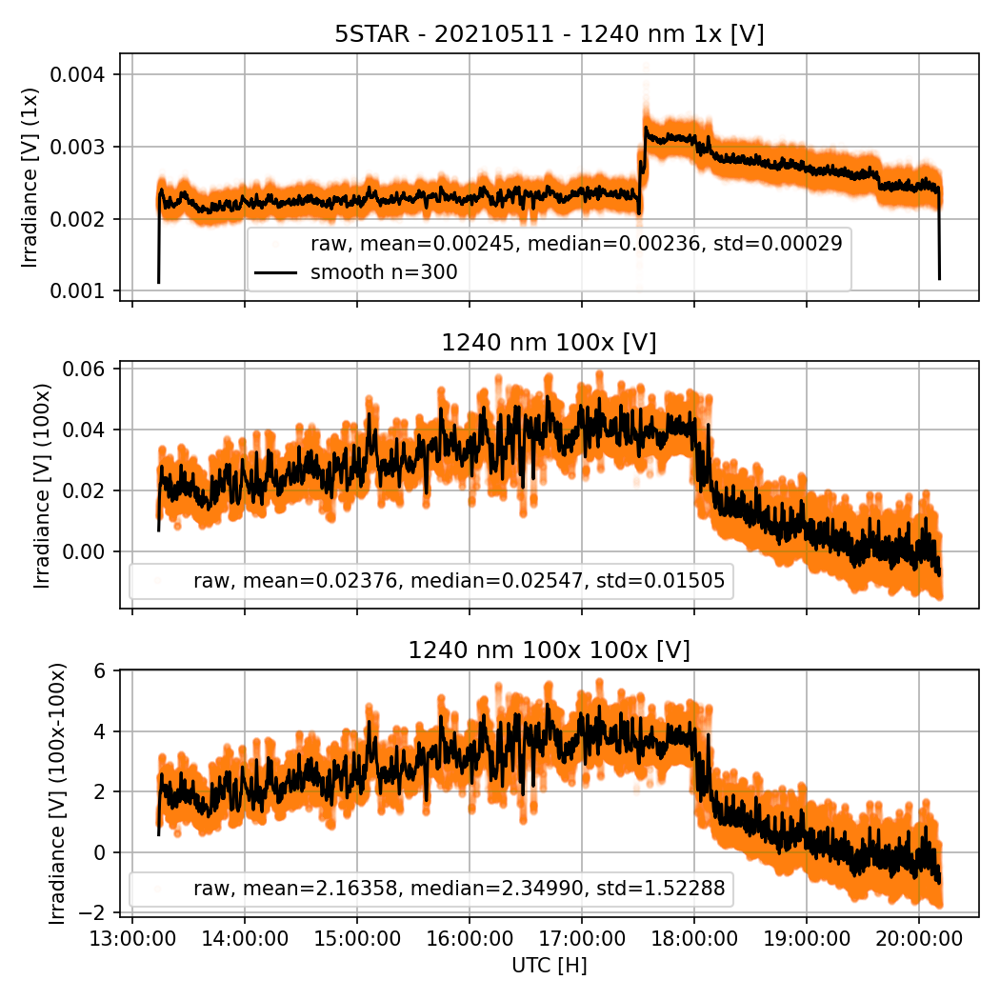

<IPython.core.display.Javascript object>


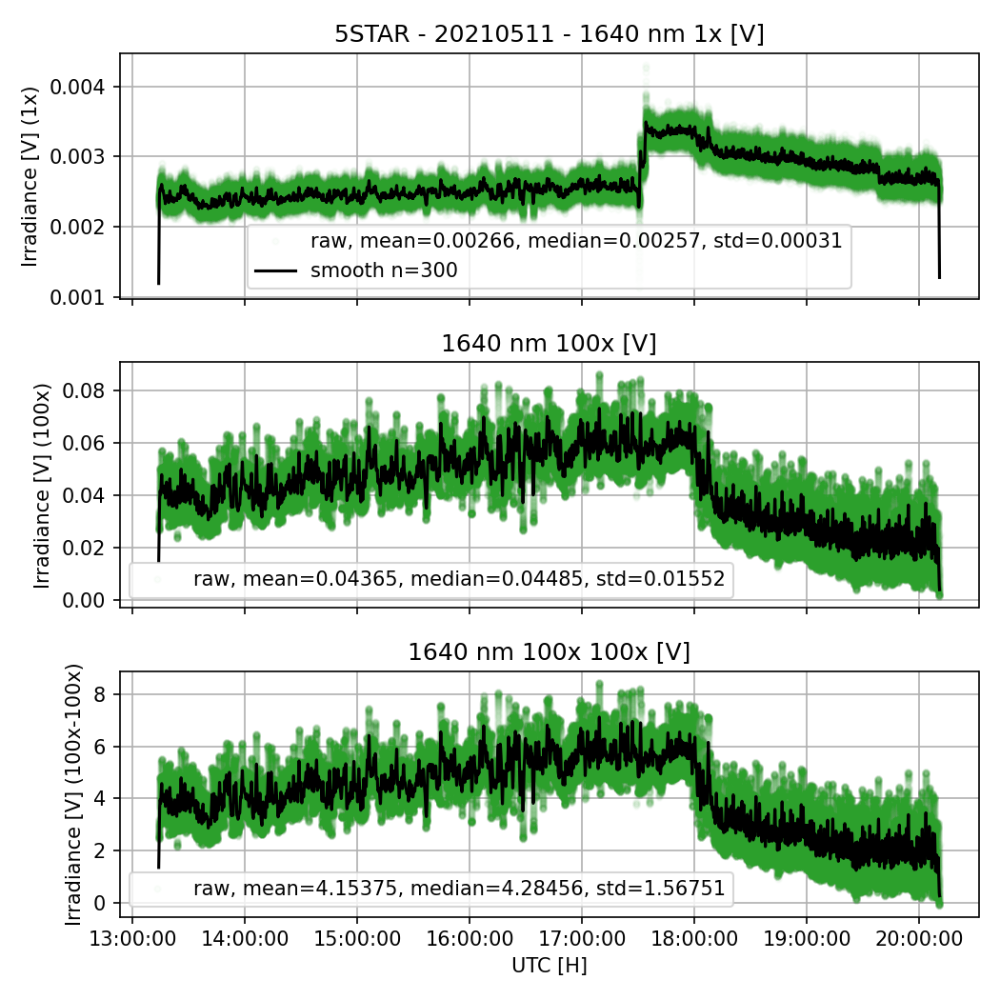

<IPython.core.display.Javascript object>


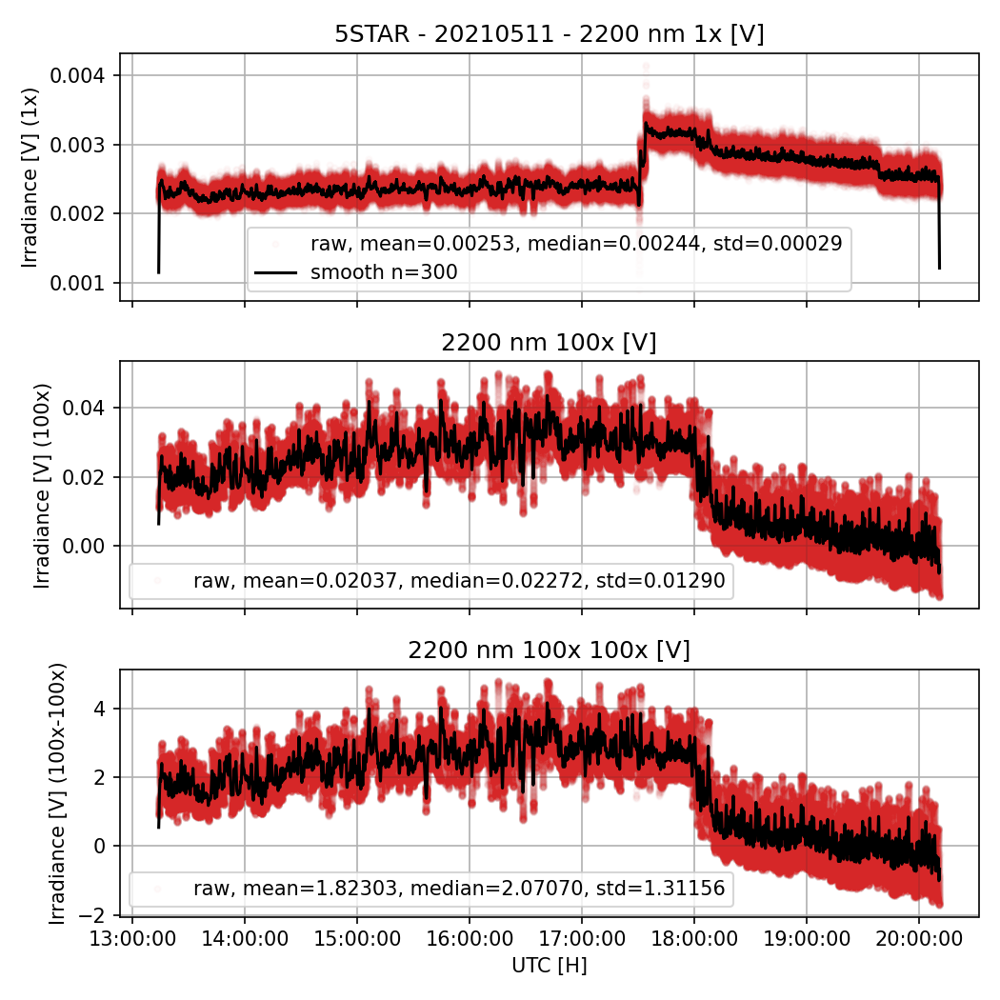

In [89]:
u.plot_channels(s,fp+'plots/{s.daystr}_{s.label}/'.format(s=s),dpi=200)

<IPython.core.display.Javascript object>


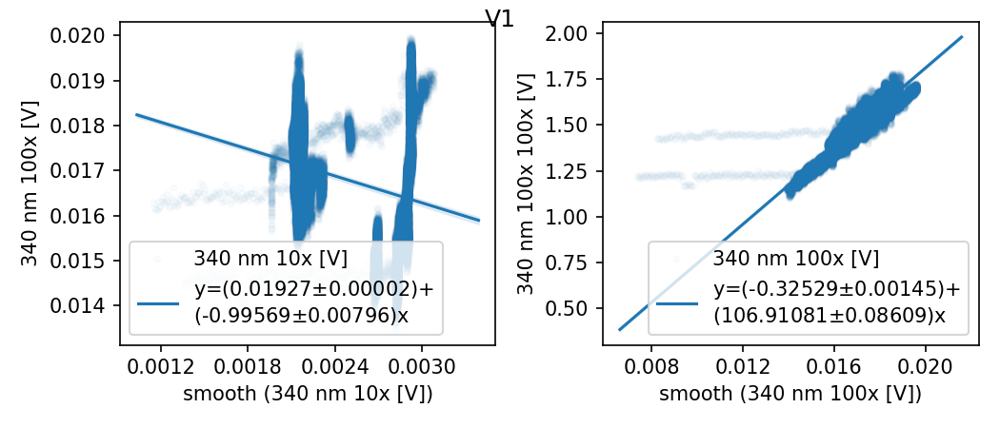

<IPython.core.display.Javascript object>


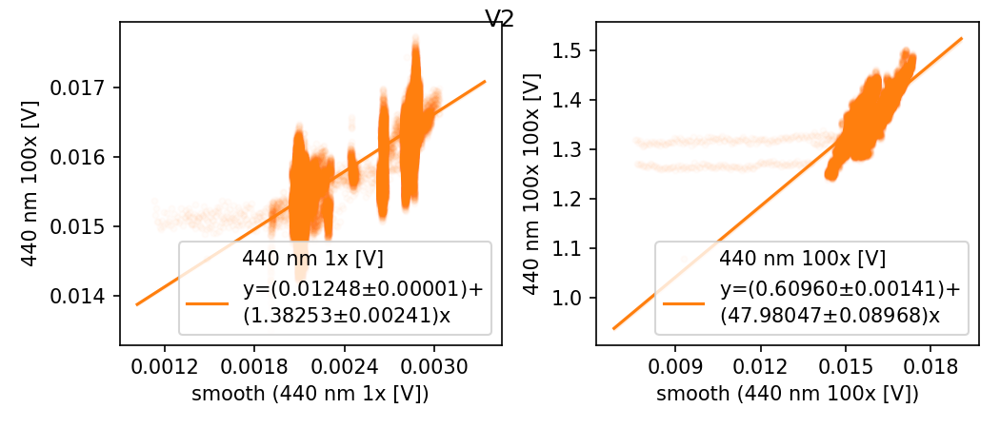

<IPython.core.display.Javascript object>


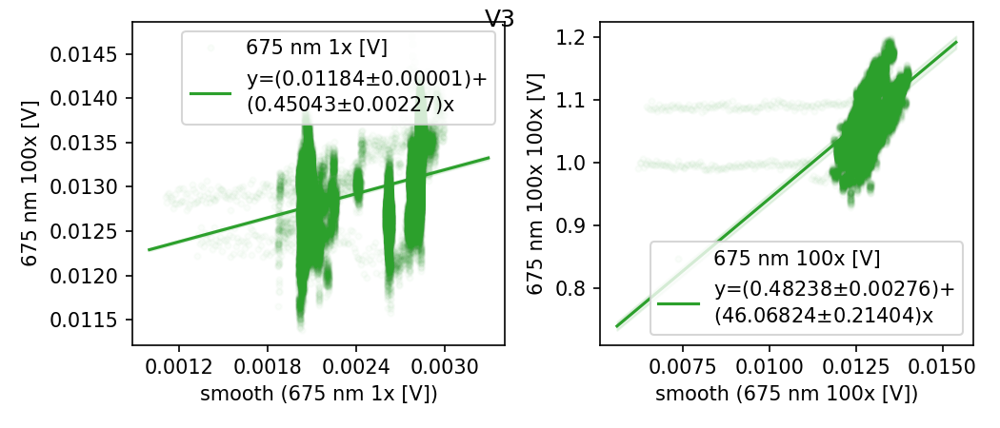

<IPython.core.display.Javascript object>


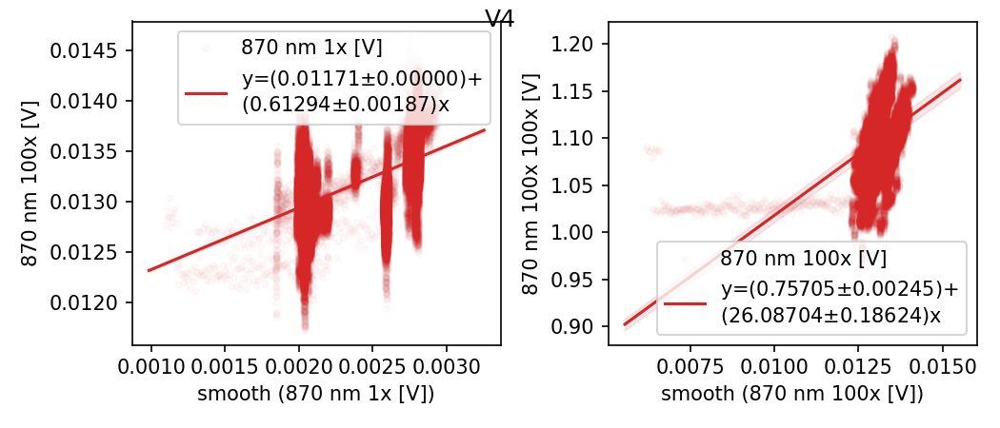

<IPython.core.display.Javascript object>


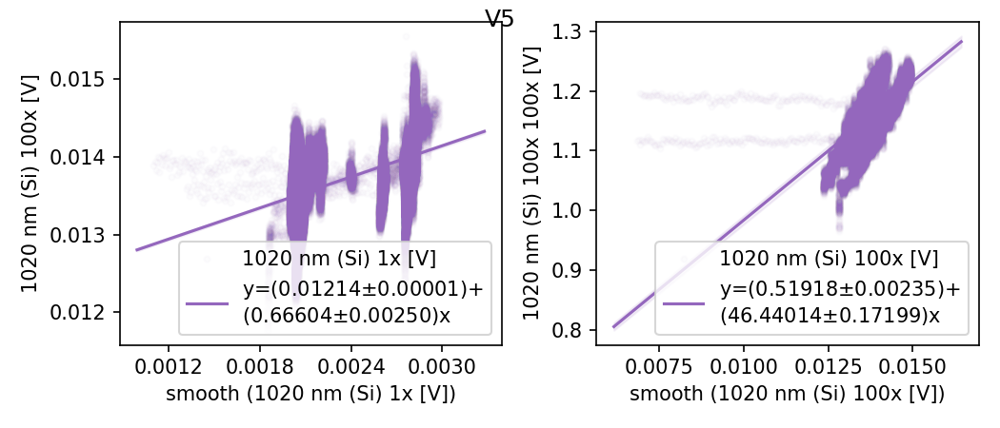

<IPython.core.display.Javascript object>


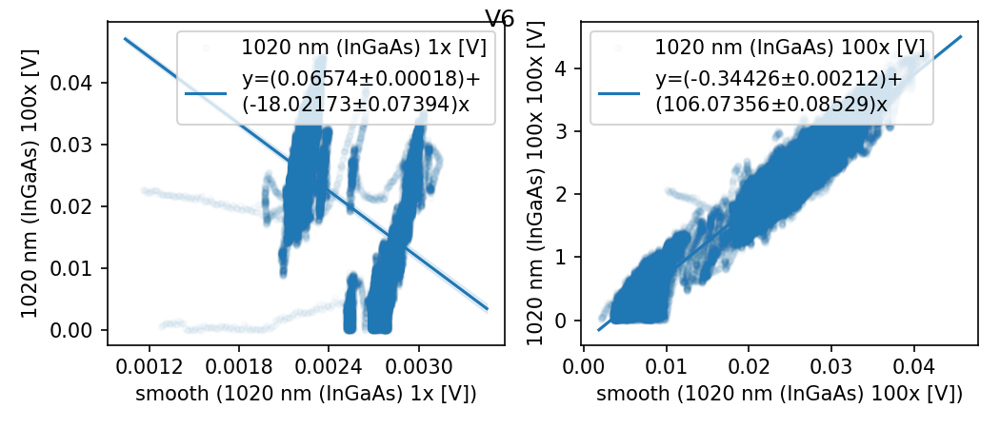

<IPython.core.display.Javascript object>


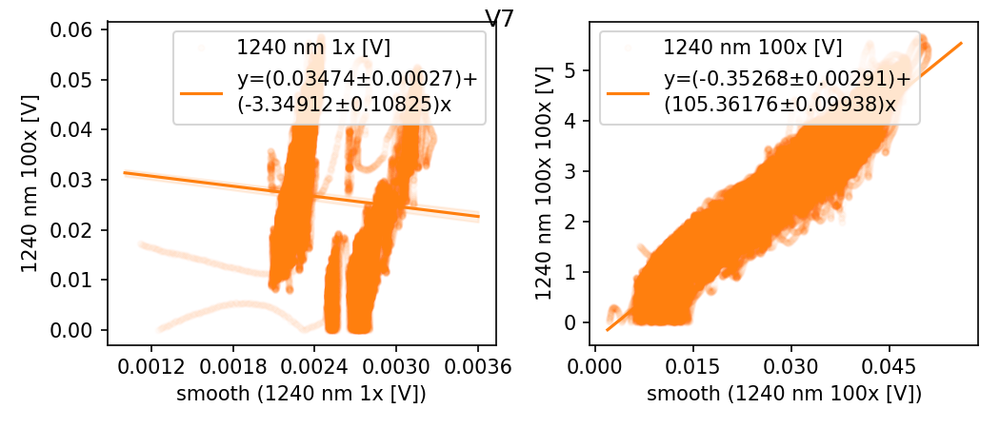

<IPython.core.display.Javascript object>


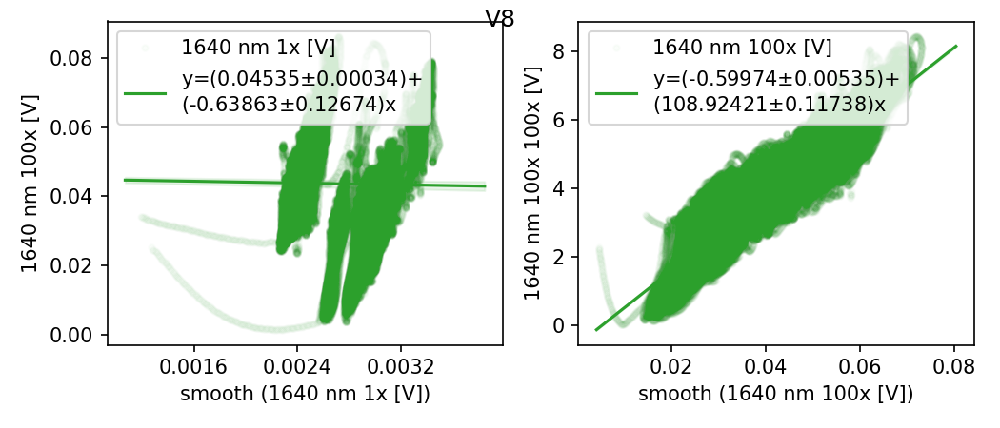

<IPython.core.display.Javascript object>


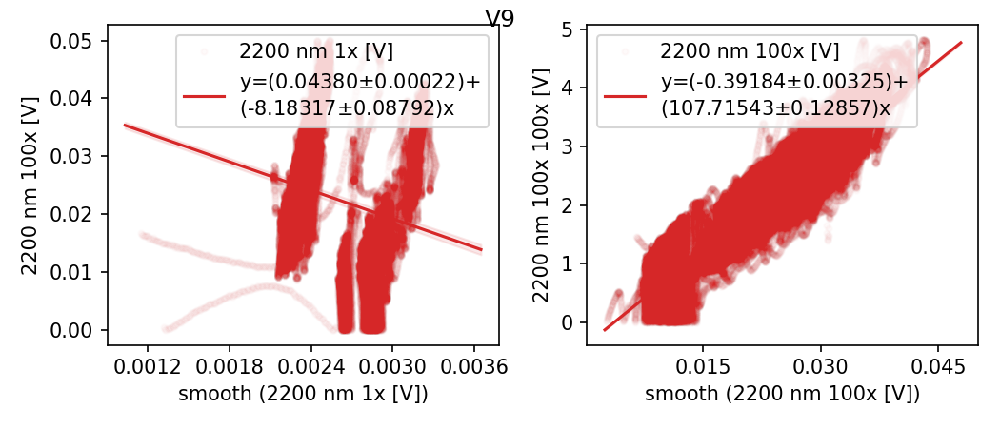

In [96]:
u.plot_all_gainratios(s,fp+'plots/')

In [94]:
u.plt_corrs(s,fp+'plots/')

problem with corr gain 0 temp nir_block
problem with corr gain 0 temp vis_block
problem with corr gain 0 temp nir_tec_V
problem with corr gain 2 temp nir_block
problem with corr gain 2 temp vis_block
problem with corr gain 2 temp nir_tec_V
problem with corr gain 4 temp nir_block
problem with corr gain 4 temp vis_block
problem with corr gain 4 temp nir_tec_V
